# PCA

In [1]:
## it is a method which is used to extraction of features 
## it is a techinque which is used to reduce the dimensionallity of the feature 
## why we use PCA 
## reduces the size in terms of dimnesion 
## faster exceution of algorithm 
## visualization 
## it reduces 

In [35]:
import numpy as np
import pandas as pd

np.random.seed(23) 

mu_vec1 = np.array([0, 0, 0])
cov_mat1 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
class1_sample = np.random.multivariate_normal(mu_vec1, cov_mat1, 20)

df = pd.DataFrame(class1_sample, columns=['feature1', 'feature2', 'feature3'])
df['target'] = 1

mu_vec2 = np.array([1, 1, 1])
cov_mat2 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
class2_sample = np.random.multivariate_normal(mu_vec2, cov_mat2, 20)

df1 = pd.DataFrame(class2_sample, columns=['feature1', 'feature2', 'feature3'])
df1['target'] = 0

# Concatenate df and df1
df = pd.concat([df, df1], ignore_index=True)

df = df.sample(40)

df2 =df
df2.head()

,feature1,feature2,feature3,target
2,-0.367548,-1.137460,-1.322148,1
34,0.177061,-0.598109,1.226512,0
14,0.420623,0.411620,-0.071324,1
11,1.968435,-0.547788,-0.679418,1
12,-2.506230,0.146960,0.606195,1


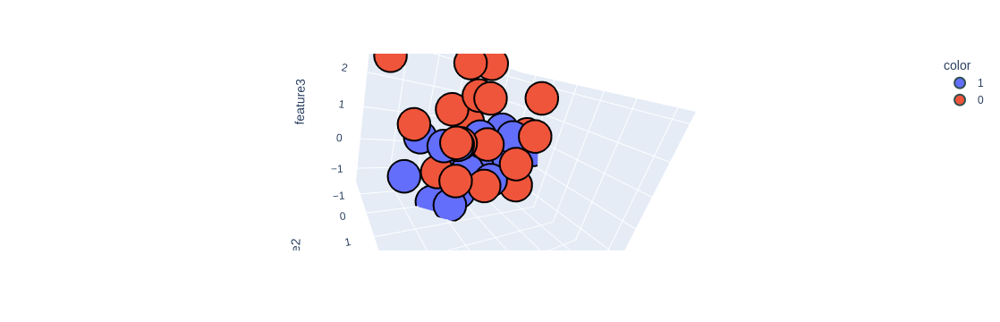

In [9]:
import plotly.express as px
fig = px.scatter_3d(df,x =df['feature1'],y=df['feature2'],z =df['feature3'],
                   color = df['target'].astype('str'))

fig.update_traces(marker = dict(size =12,line =dict(width =2,color ='DarkSlateGrey')),
                 selector =dict(mode ='markers'))

fig.show()

In [32]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

df.iloc[:,0:3] =scaler.fit_transform(df.iloc[:,0:3])
df.head()

,feature1,feature2,feature3
0,0.473294,0.167622,-0.987345
1,0.724424,1.169350,-1.332261
2,-0.449148,-1.556529,-1.674155
3,1.458807,-0.385625,0.838706
4,0.165928,0.218801,-1.322635


In [14]:
covari_matrix = np.cov([df.iloc[:,0],df.iloc[:,1],df.iloc[:,2]])

In [16]:
covari_matrix

array([[1.02564103, 0.20478114, 0.080118  ],
       [0.20478114, 1.02564103, 0.19838882],
       [0.080118  , 0.19838882, 1.02564103]])

In [17]:
eigen_values ,eigen_vectors =np.linalg.eig(covari_matrix)

In [18]:
eigen_values

array([1.3536065 , 0.94557084, 0.77774573])

In [19]:
eigen_vectors

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442],
       [-0.52848211,  0.72025103,  0.44938304]])

In [26]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch

class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)

# Sample data
np.random.seed(23) 
mu_vec1 = np.array([0, 0, 0])
cov_mat1 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
class1_sample = np.random.multivariate_normal(mu_vec1, cov_mat1, 20)
df = pd.DataFrame(class1_sample, columns=['feature1', 'feature2', 'feature3'])

# Calculate eigenvalues and eigenvectors
cov_mat = np.cov(df.T)
eigen_values, eigen_vectors = np.linalg.eig(cov_mat)

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111, projection='3d')

ax.plot(df['feature1'], df['feature2'], df['feature3'], 'o', markersize=8, color='blue', alpha=0.2)
ax.plot([df['feature1'].mean()], [df['feature2'].mean()], [df['feature3'].mean()], 'o', markersize=10, color='red', alpha=0.5)

for v in eigen_vectors.T:
    a = Arrow3D([df['feature1'].mean(), v[0]], [df['feature2'].mean(), v[1]], [df['feature3'].mean(), v[2]], mutation_scale=20, lw=3, arrowstyle="-|>", color="r")
    ax.add_artist(a)

ax.set_xlabel('x_values')
ax.set_ylabel('y_values')
ax.set_zlabel('z_values')
plt.title('Eigenvectors')
plt.show()


AttributeError: 'Arrow3D' object has no attribute 'do_3d_projection'

<Figure size 700x700 with 1 Axes>

In [27]:
pc = eigen_vectors[:2]
pc

array([[-0.9427458 , -0.26768973,  0.19892854],
       [-0.13433401,  0.8507233 ,  0.50815769]])

In [36]:
transformed_df = np.dot(df.iloc[:,0:3],pc.T)

new_df =pd.DataFrame(transformed_df,columns=['PC1','PC2'])
new_df['target'] =df2['target'].values

new_df

,PC1,PC2,target
0,0.387978,-1.590149,1
1,0.237172,0.090651,0
2,-0.520915,0.257427,1
3,-1.844252,-1.075695,1
4,2.443988,0.769738,1
5,-1.693010,1.127346,0
6,-1.921602,0.502976,0
7,-0.527545,-0.522194,1
8,0.273698,1.296905,0
9,-2.047971,0.677760,0


## using sklearn library to implement pca

In [1]:
import numpy as np
import pandas as pd

df = pd.read_csv('digit_rec.csv')

In [2]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(42000, 785)

In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
23078,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
import matplotlib.pyplot as plt


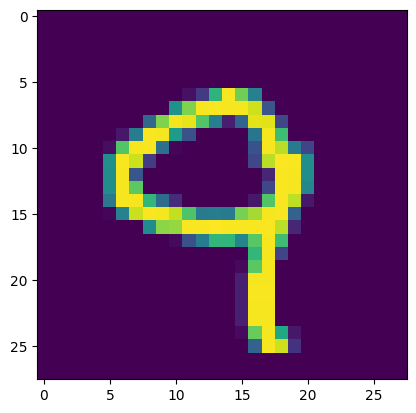

In [7]:
plt.imshow(df.iloc[23078,1:].values.reshape(28,28))

In [8]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [9]:
X

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
y

0        1
1        0
2        1
3        4
4        0
        ..
41995    0
41996    1
41997    7
41998    6
41999    9
Name: label, Length: 42000, dtype: int64

In [11]:
from sklearn.model_selection import train_test_split

In [17]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size = 0.2 ,random_state = 42)

In [18]:
x_train.shape

(33600, 784)

In [19]:
y_train.shape

(33600,)

In [20]:
x_train.sample(5)

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
5299,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27257,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11801,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11258,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38139,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
y_train.sample(4)

28761    2
24412    6
12130    7
28762    8
Name: label, dtype: int64

In [22]:
from sklearn.neighbors import KNeighborsClassifier

In [23]:
knn = KNeighborsClassifier()

In [25]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [26]:
import time
start = time.time()
y_pred = knn.predict(x_test)
print(time.time() - start)

10.981888055801392


In [27]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [28]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [29]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [30]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 200)

In [31]:
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [33]:
x_train_trf.shape

(33600, 200)

In [34]:
x_test_trf.shape

(8400, 200)

In [36]:
knn =KNeighborsClassifier()

In [38]:
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [39]:
y_pred = knn.predict(x_test_trf)

In [40]:
accuracy_score(y_pred,y_test)

0.9508333333333333

In [43]:
for i in range(1,100):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(x_train)
    X_test_trf = pca.transform(x_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.2573809523809524
0.3242857142857143
0.5102380952380953
0.6664285714285715
0.7383333333333333
0.8225
0.843452380952381
0.8727380952380952
0.8872619047619048
0.905
0.9111904761904762
0.9178571428571428
0.9278571428571428
0.9347619047619048
0.9385714285714286
0.9382142857142857
0.9408333333333333
0.9408333333333333
0.9425
0.9433333333333334
0.9429761904761905
0.9442857142857143
0.9448809523809524
0.945595238095238
0.9473809523809524
0.9482142857142857
0.9473809523809524
0.9483333333333334
0.9492857142857143
0.9495238095238095
0.950595238095238
0.9507142857142857
0.9497619047619048
0.9507142857142857
0.9513095238095238
0.9519047619047619
0.9529761904761904
0.9528571428571428
0.950595238095238
0.9522619047619048
0.9522619047619048
0.9519047619047619
0.9530952380952381
0.9536904761904762
0.9532142857142857
0.9542857142857143
0.9525
0.9536904761904762
0.9534523809523809
0.9538095238095238
0.9536904761904762
0.9539285714285715
0.9542857142857143
0.9544047619047619
0.9544047619047619
0.954166

In [44]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

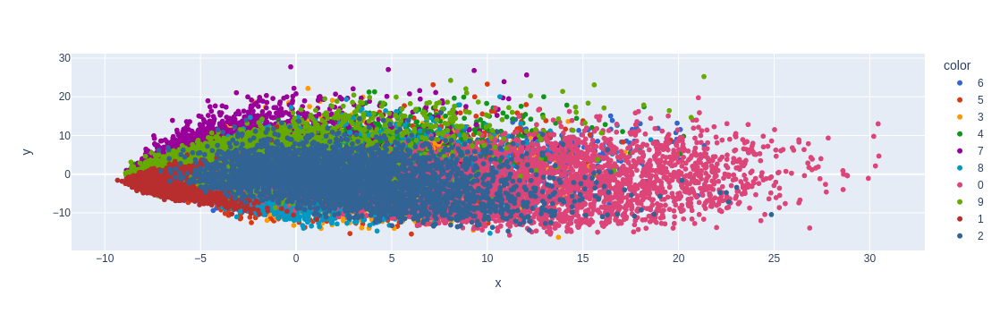

In [45]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [46]:
# transforming to a 2D coordinate system
pca = PCA(n_components=3)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

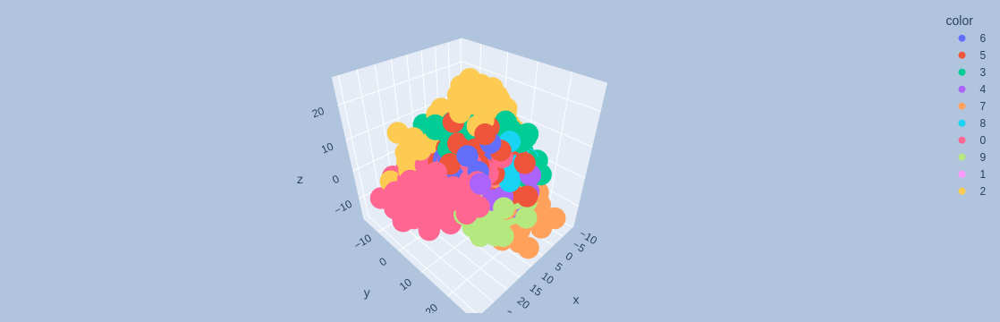

In [53]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=10, r=10, t=10, b=10),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [54]:


pca.explained_variance_
# Eigen values



array([40.67111198, 29.17023394, 26.74459602])

In [55]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [56]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [59]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(x_train)
X_test_trf = pca.transform(x_test)

In [60]:
pca.explained_variance_.shape

(784,)

In [61]:
pca.components_.shape

(784, 784)

In [62]:


np.cumsum(pca.explained_variance_ratio_)



array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296